# Load data

In [2]:
# import the relabeled data from local file
import xarray as xr
Relabeled_data_path = 'D:/VScode/MRes/Clustering_under_the_ice/Relabeled_data/'
ds_fit_relabeled_750_latlonT_5_60_95_k4=xr.open_dataset(Relabeled_data_path + 'ds_fit_relabeled_750_latlonT_5_60_95_k4.nc')
ds_fit_relabeled_750_latlonT_5_50_95_k4=xr.open_dataset(Relabeled_data_path + 'ds_fit_relabeled_750_latlonT_5_50_95_k4.nc')
ds_fit_relabeled_750_latlonT_5_70_95_k4=xr.open_dataset(Relabeled_data_path + 'ds_fit_relabeled_750_latlonT_5_70_95_k4.nc')

# Plot the spatial distribution of labels for each season

In [5]:
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
from pandas import DatetimeIndex
import numpy as np
from matplotlib.colors import ListedColormap

def plot_dist_by_season(ds):
    """
    Args:
    ds (xarray): The input data.

    Returns:
        None
    """
    # Create a new column 'season' based on the month
    ds['season'] = (ds['date'].dt.month % 12 + 3) // 3
    season_list=['DJF', 'MAM', 'JJA','SON']

    ds_grouped = ds.groupby('season')

    # Calculate the number of rows and columns for the subplots
    num_seasons = len(ds_grouped)
    num_cols = 2
    num_rows = (num_seasons + num_cols - 1) // num_cols

    # Create a figure and axes for the subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(4*num_cols, 4*num_rows), dpi=300)

    # Flatten the axes array for ease of iteration
    axes = axes.flatten()
    
    unique_labels = np.unique(ds.PCM_LABELS.values)
    num_labels = len(unique_labels)
    # cmap = plt.cm.get_cmap('tab20', num_labels)
    color_list = ['red', 'saddlebrown', 'deepskyblue', 'purple'] 
    cmap = ListedColormap(color_list)

    # Loop through the group and plot the data distribution
    for i, (season, ds) in enumerate(ds_grouped):
        # Select the current subplot
        ax = axes[i]

        # Create a polar stereographic basemap
        map = Basemap(projection='npstere', boundinglat=60, lon_0=0, resolution='l', ax=ax)

        # Set the map coordinates to match the data extent
        map.drawmapboundary(fill_color='white')
        map.fillcontinents(color='gray', lake_color='white')

        lon_vals = ds.lon.values
        lat_vals = ds.lat.values

        # Convert lon/lat to map projection coordinates
        x, y = map(lon_vals, lat_vals)

        # Plot the boundary on the map
        sc=map.scatter(x, y, c=ds.PCM_LABELS.values,cmap=cmap,label=f'{season}',s=2)

        cbar = plt.colorbar(sc, ax=ax, shrink=0.7, pad=0.02)
        cbar.ax.set_ylabel('class')
        cbar.set_ticks(np.arange(0, num_labels, 1))


        # Add title for the subplot
        ax.set_title(f'{season_list[i]}')

    # Delete the unused subplots
    for i in range(num_seasons, num_cols * num_rows):
        fig.delaxes(axes[i])

    # Show the plot
    plt.show()


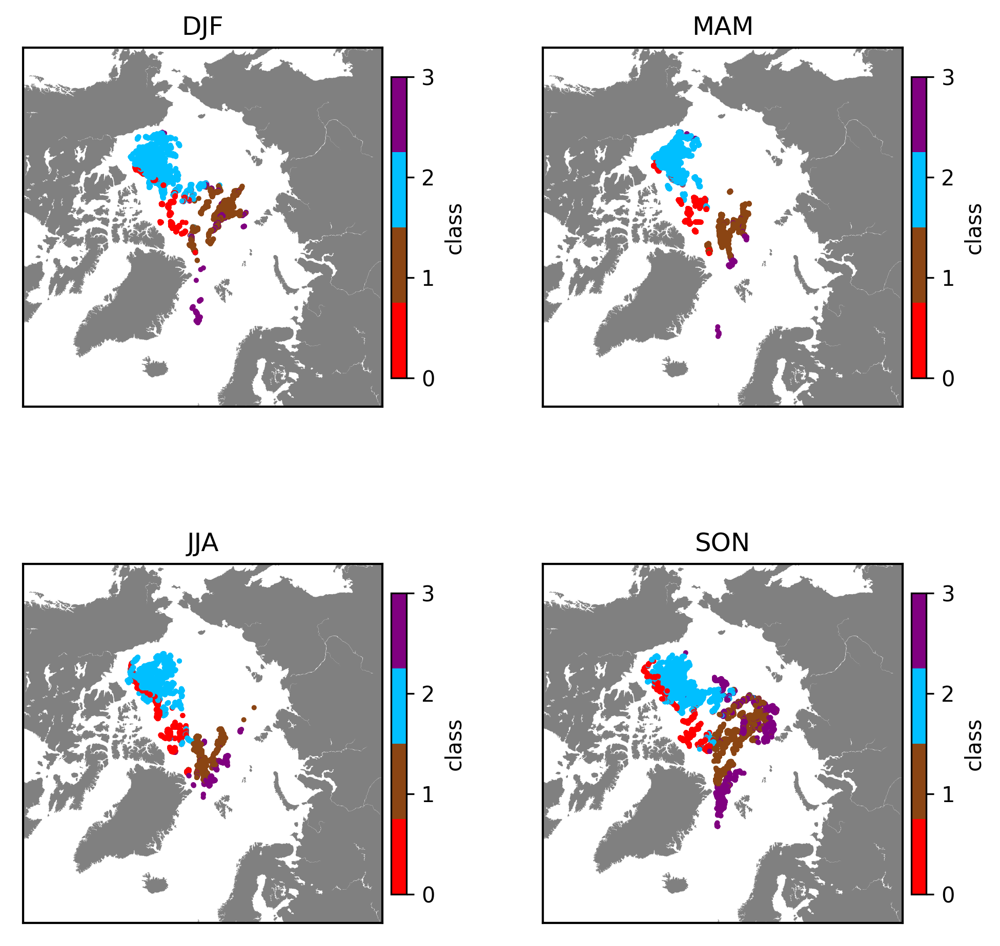

In [5]:
plot_dist_by_season(ds_fit_relabeled_750_latlonT_5_60_95_k4)

# Compare the probability of a class for each season

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

def plot_single_class_prob_by_season(ds, class_num=0):
    """
    Args:
    ds (xarray): The input data.
    class_num (int): The class number to plot.

    Returns:
        None
    """
        
    # Create a new column 'season' based on the month
    ds['season'] = (ds['date'].dt.month % 12 + 3) // 3
    season_list=['DJF', 'MAM', 'JJA','SON']

    ds_grouped = ds.groupby('season')

    # Calculate the number of rows and columns for the subplots
    num_seasons = len(ds_grouped)
    num_cols = 2
    num_rows = (num_seasons + num_cols - 1) // num_cols

    # Create a figure and axes for the subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(8*num_cols, 8*num_rows), dpi=300)

    # Flatten the axes array for ease of iteration
    axes = axes.flatten()
    
    # unique_labels = np.unique(ds.PCM_LABELS.values)
    # num_labels = len(unique_labels)
    # # cmap = plt.cm.get_cmap('tab20', num_labels)
    # color_list = ['red', 'saddlebrown', 'deepskyblue', 'purple'] 
    # cmap = ListedColormap(color_list)

    lon_min, lon_max = -180, 180
    lat_min, lat_max = 70, 90
    lat_step = 10
    lon_step = 20

    # Loop through the group and plot the data distribution
    for i, (season, ds) in enumerate(ds_grouped):
        # Select the current subplot
        ax = axes[i]

        # Create a polar stereographic basemap
        m = Basemap(projection='npstere', boundinglat=60, lon_0=0, resolution='l', ax=ax)

        # Set the map coordinates to match the data extent
        m.drawparallels(np.arange(lat_min, lat_max + 1, lat_step), labels=[], linewidth=0.1)
        m.drawcoastlines()
        m.fillcontinents(color='grey', lake_color='lightblue')
        m.drawmeridians(np.arange(lon_min, lon_max + 1, lon_step), labels=[1, 0, 0, 1], linewidth=0.1)

        # # Add title for the subplot
        # ax.set_title(f'{season_list[i]}')

        pcm_post = ds.PCM_POST.values[class_num, :]
        x, y = m(ds['lon'], ds['lat'])
        pcm_post[pcm_post < 0.4] = 0.05

        sc = m.scatter(x, y, s=3, c=np.array([pcm_post]), cmap='Blues', vmin=0, vmax=np.max(pcm_post))
        # plot the pcm_post larger than 0.5
        m.scatter(x[pcm_post > 0.5], y[pcm_post > 0.5], s=3, c=np.array([pcm_post[pcm_post > 0.5]]), cmap='Blues', vmin=0, vmax=np.max(pcm_post))

        cbar = plt.colorbar(sc, ax=ax, shrink=0.7, pad=0.02)
        cbar.ax.set_ylabel('Probability')
        # add a title and set the font size
        ax.set_title(f'{season_list[i]}, Probability of class {class_num}', fontsize=12)

        for lat in np.arange(lat_min, lat_max + 1, lat_step):
            if lat < 80:
                x, y = m(0, lat+1)
            else:
                x, y = m(0, lat)
                
            ax.text(x, y, f'{lat}°N', fontsize=8, ha='center', va='center', color='k',
                    bbox=dict(facecolor='w', edgecolor='None', alpha=1))


    # Delete the unused subplots
    for i in range(num_seasons, num_cols * num_rows):
        fig.delaxes(axes[i])



    plt.subplots_adjust(wspace=0.3, hspace=0.1)
    plt.show()



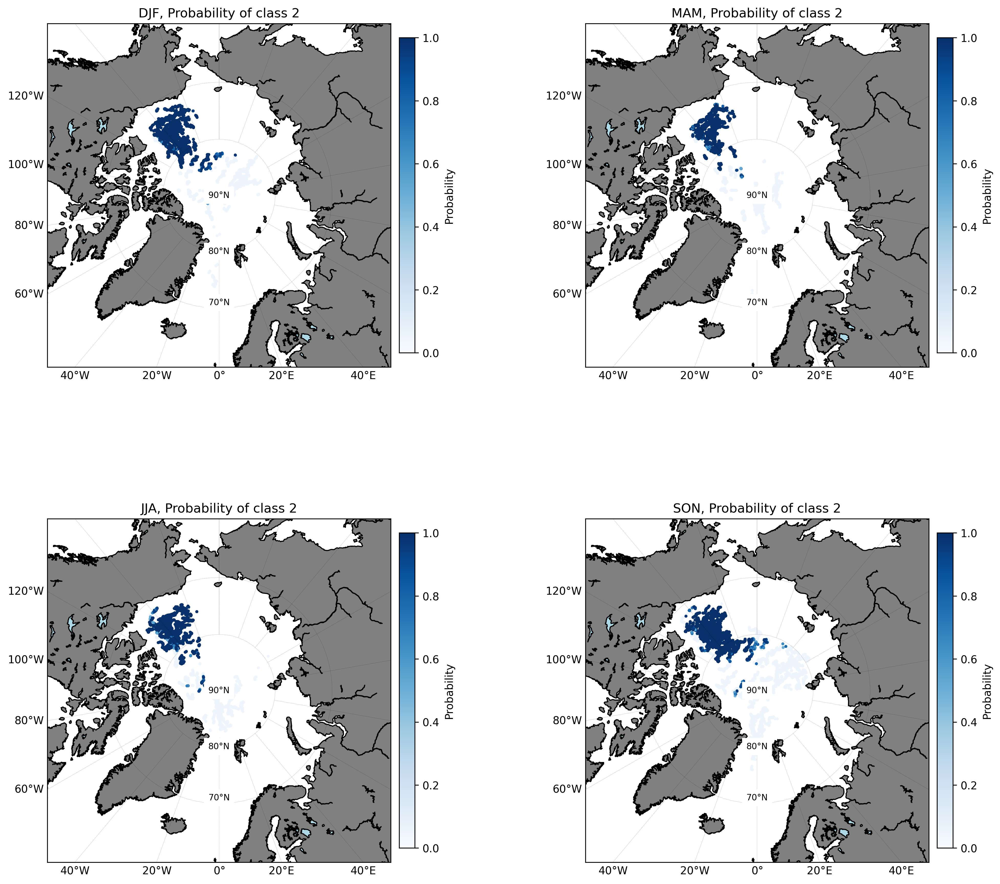

In [11]:
plot_single_class_prob_by_season(ds_fit_relabeled_750_latlonT_5_60_95_k4, class_num=2)

# Compare the average profile of a class for different seasons

In [17]:
(8% 12 + 3) // 3

3

In [24]:
import matplotlib.pyplot as plt

def plot_mean_profile_by_season(ds_fit,season2comp=['DJF','JJA'] ,class_num=0):
    
    """
    Args:
    ds_fit (xarray): The input data.
    season2comp (list): The seasons to compare.
    class_num (int): The class number to plot.

    Returns:
        None
    """

    # Create a new column 'season' based on the month
    ds_fit['season'] = (ds_fit['date'].dt.month % 12 + 3) // 3
    season_list=['DJF', 'MAM', 'JJA','SON']

    ds_grouped = ds_fit.groupby('season')
    num_seasons = len(ds_grouped)

    # Create a figure and axes for the subplots
    fig, axes = plt.subplots(1, 2, figsize=(8, 3), dpi=300)
    # color_list = ['red', 'saddlebrown', 'deepskyblue', 'purple'] 
    # cmap = plt.cm.get_cmap('tab20', num_seasons)
    # color_list=cmap.colors
    color_list = ['deepskyblue', 'red']

    for j in range(len(season2comp)):
    
        for i, (season, ds_season) in enumerate(ds_grouped):
            
            # print(f'Season {season}')

            # compare the season with the season2comp
            if season_list[i]==season2comp[j]:
                print(f'Season2compare {season2comp[j]}')
                print(f'Season in the ds  {season}')

                ds_class = ds_season.where(ds_season.PCM_LABELS == class_num, drop=True)

                qua5_temp = np.quantile(ds_class['temperature'], 0.05, axis=0)
                qua95_temp = np.quantile(ds_class['temperature'], 0.95, axis=0)
                qua50_temp = np.quantile(ds_class['temperature'], 0.50, axis=0)

                qua5_salinity = np.quantile(ds_class['salinity'], 0.05, axis=0)
                qua95_salinity = np.quantile(ds_class['salinity'], 0.95, axis=0)
                qua50_salinity = np.quantile(ds_class['salinity'], 0.50, axis=0)

                ax = axes[0]
                ax.plot(qua50_temp, ds_fit['pressure'].values, c=color_list[j], label=f'{season2comp[j]}')
                ax.fill_betweenx(ds_fit['pressure'].values, qua5_temp, qua95_temp, color=color_list[j], alpha=0.5)
                ax.legend(loc='lower left')
                ax.set_ylim([np.min(ds_fit['pressure'].values), np.max(ds_fit['pressure'].values)])
                ax.set_ylabel('Pressure (dbar)')
                # set the yticklabels to be its absolute value
                yticklabels = [str(abs(int(tick))) for tick in ax.get_yticks()]
                ax.set_yticklabels(yticklabels)
                ax.set_xlabel('Temperature (°C)')

                ax = axes[1]
                ax.plot(qua50_salinity, ds_fit['pressure'].values, c=color_list[j], label=f'{season2comp[j]}')
                ax.fill_betweenx(ds_fit['pressure'].values, qua5_salinity, qua95_salinity, color=color_list[j], alpha=0.5)
                ax.set_ylim([np.min(ds_fit['pressure'].values), np.max(ds_fit['pressure'].values)])
                # ax.legend(loc='lower left')
                # ax.set_ylabel('Pressure')
                ax.set_xlabel('Salinity (g/kg)')
                # set the yticklabels to be its absolute value
                yticklabels = [str(abs(int(tick))) for tick in ax.get_yticks()]
                ax.set_yticklabels(yticklabels)

    plt.show()


Season2compare DJF
Season in the ds  1


C:\Users\zps19\AppData\Local\Temp\ipykernel_29428\2439830547.py:58: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticklabels)
C:\Users\zps19\AppData\Local\Temp\ipykernel_29428\2439830547.py:70: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticklabels)


Season2compare JJA
Season in the ds  3


C:\Users\zps19\AppData\Local\Temp\ipykernel_29428\2439830547.py:58: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticklabels)
C:\Users\zps19\AppData\Local\Temp\ipykernel_29428\2439830547.py:70: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticklabels)


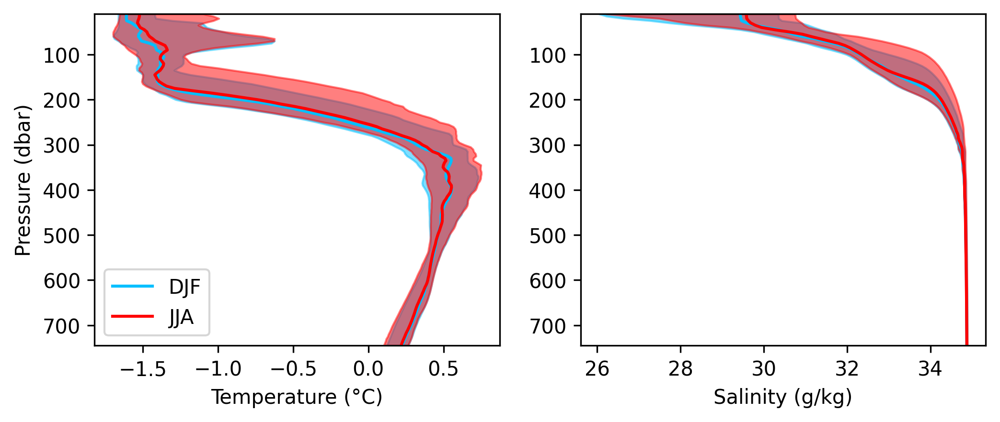

In [25]:
plot_mean_profile_by_season(ds_fit_relabeled_750_latlonT_5_60_95_k4,season2comp=['DJF','JJA'],class_num=0)

Season2compare DJF
Season in the ds  1


C:\Users\zps19\AppData\Local\Temp\ipykernel_29428\2439830547.py:58: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticklabels)
C:\Users\zps19\AppData\Local\Temp\ipykernel_29428\2439830547.py:70: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticklabels)


Season2compare JJA
Season in the ds  3


C:\Users\zps19\AppData\Local\Temp\ipykernel_29428\2439830547.py:58: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticklabels)
C:\Users\zps19\AppData\Local\Temp\ipykernel_29428\2439830547.py:70: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticklabels)


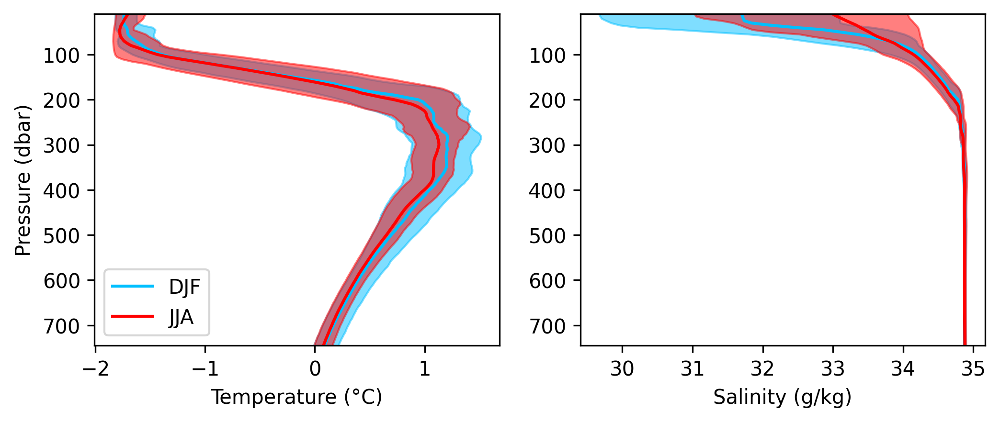

In [26]:
plot_mean_profile_by_season(ds_fit_relabeled_750_latlonT_5_60_95_k4,season2comp=['DJF','JJA'],class_num=1)

C:\Users\zps19\AppData\Local\Temp\ipykernel_896\234035992.py:57: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticklabels)
C:\Users\zps19\AppData\Local\Temp\ipykernel_896\234035992.py:69: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticklabels)
C:\Users\zps19\AppData\Local\Temp\ipykernel_896\234035992.py:57: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticklabels)
C:\Users\zps19\AppData\Local\Temp\ipykernel_896\234035992.py:69: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticklabels)


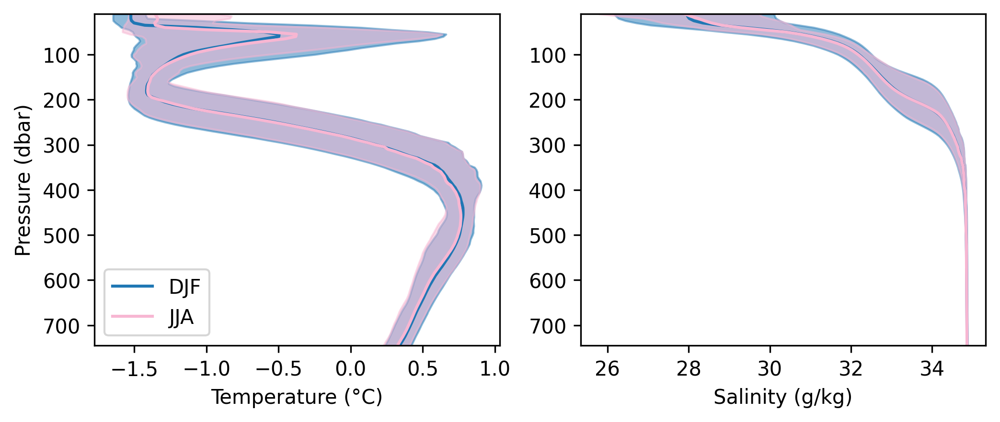

In [24]:
plot_mean_profile_by_season(ds_fit_relabeled_750_latlonT_5_60_95_k4,season2comp=['DJF','JJA'],class_num=2)

Season2compare DJF
Season in the ds  1


C:\Users\zps19\AppData\Local\Temp\ipykernel_29428\2439830547.py:58: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticklabels)
C:\Users\zps19\AppData\Local\Temp\ipykernel_29428\2439830547.py:70: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticklabels)


Season2compare JJA
Season in the ds  3


C:\Users\zps19\AppData\Local\Temp\ipykernel_29428\2439830547.py:58: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticklabels)
C:\Users\zps19\AppData\Local\Temp\ipykernel_29428\2439830547.py:70: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticklabels)


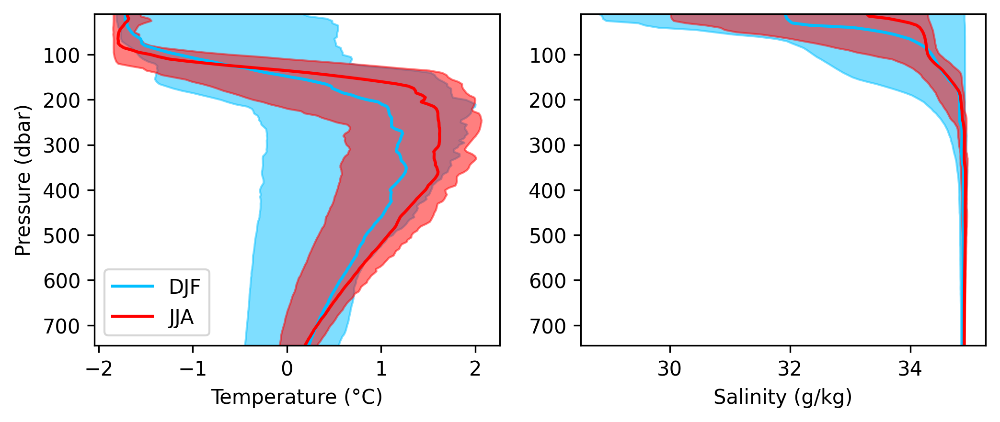

In [27]:
plot_mean_profile_by_season(ds_fit_relabeled_750_latlonT_5_60_95_k4,season2comp=['DJF','JJA'],class_num=3)

# Seperate the data into two group that each cover a decade, and see how the probability of a class changed

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
import pandas as pd

def plot_single_class_likelihood_by_decade(ds_fit, class_num=0):
    # create a new column 'decade' based on the year
    # ds_fit['decade'] = []
    # Create a new column 'decade' based on the year
    # ds_fit['decade'] = (ds_fit['date'].dt.year // 10) * 10
    # ds_fit['decade'] = pd.cut(ds_fit['date'].dt.year, bins=[2004, 2013, 2022], labels=['2004-2012', '2013-2022'])
    # ds_fit.assign_coords(decade=pd.cut(ds_fit['date'].dt.year, bins=[2004, 2013, 2022], labels=['2004-2012', '2013-2022']))
    # ds['season'] = (ds['date'].dt.month % 12 + 3) // 3
    
    decade_list=['2004-2012', '2013-2022']
    decade_start=[2004, 2013]

    # ds_grouped = ds_fit.groupby('decade')

    # Calculate the number of rows and columns for the subplots
    # num_seasons = len(ds_grouped)
    num_cols = 2
    num_rows =1# (num_seasons + num_cols - 1) // num_cols

    # Create a figure and axes for the subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(8*num_cols, 8*num_rows), dpi=300)

    # Flatten the axes array for ease of iteration
    axes = axes.flatten()
    

    lon_min, lon_max = -180, 180
    lat_min, lat_max = 70, 90
    lat_step = 10
    lon_step = 20

    # Loop through the group and plot the data distribution
    
    for i in range(len(decade_list)):
        # ds_decade = ds_fit.where(ds_fit['date'].dt.year >=decade_start[i] & ds_fit['date'].dt.year <decade_start[i]+9, drop=True)
        ds = ds_fit.where((ds_fit['date'].dt.year >= decade_start[i]) & (ds_fit['date'].dt.year < decade_start[i] + 9), drop=True)


        # Select the current subplot
        ax = axes[i]

        # Create a polar stereographic basemap
        m = Basemap(projection='npstere', boundinglat=60, lon_0=0, resolution='l', ax=ax)

        # Set the map coordinates to match the data extent
        m.drawparallels(np.arange(lat_min, lat_max + 1, lat_step), labels=[], linewidth=0.1)
        m.drawcoastlines()
        m.fillcontinents(color='grey', lake_color='lightblue')
        m.drawmeridians(np.arange(lon_min, lon_max + 1, lon_step), labels=[1, 0, 0, 1], linewidth=0.1)

        # # Add title for the subplot
        # ax.set_title(f'{season_list[i]}')

        pcm_post = ds.PCM_POST.values[class_num, :]
        x, y = m(ds['lon'], ds['lat'])
        pcm_post[pcm_post < 0.4] = 0.05

        sc = m.scatter(x, y, s=3, c=np.array([pcm_post]), cmap='Blues', vmin=0, vmax=np.max(pcm_post))
        # plot the pcm_post larger than 0.5
        m.scatter(x[pcm_post > 0.5], y[pcm_post > 0.5], s=3, c=np.array([pcm_post[pcm_post > 0.5]]), cmap='Blues', vmin=0, vmax=np.max(pcm_post))

        cbar = plt.colorbar(sc, ax=ax, shrink=0.7, pad=0.02)
        cbar.ax.set_ylabel('likelihood')
        # add a title and set the font size
        ax.set_title(f'{decade_list[i]}, Likelihood of class {class_num}', fontsize=12)

        for lat in np.arange(lat_min, lat_max + 1, lat_step):
            if lat < 80:
                x, y = m(0, lat+1)
            else:
                x, y = m(0, lat)
                
            ax.text(x, y, f'{lat}°N', fontsize=8, ha='center', va='center', color='k',
                    bbox=dict(facecolor='w', edgecolor='None', alpha=1))


    # # Delete the unused subplots
    # for i in range(num_seasons, num_cols * num_rows):
    #     fig.delaxes(axes[i])



    plt.subplots_adjust(wspace=0.3, hspace=0.1)
    plt.show()



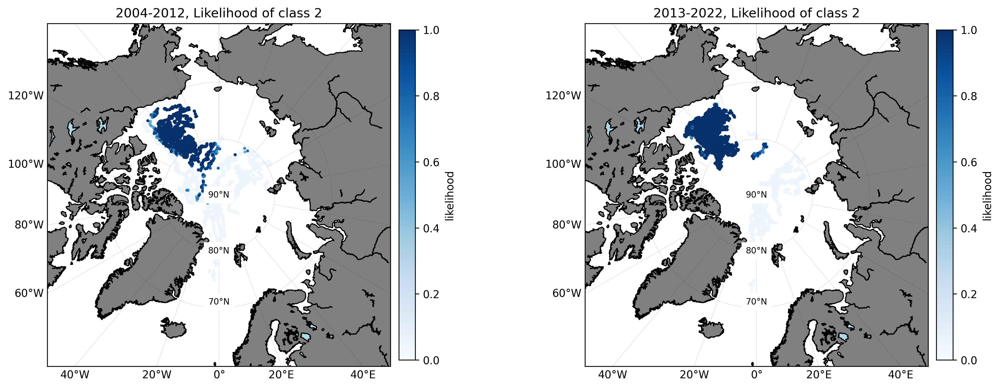

In [7]:
plot_single_class_likelihood_by_decade(ds_fit_relabeled_750_latlonT_5_60_95_k4, class_num=2)

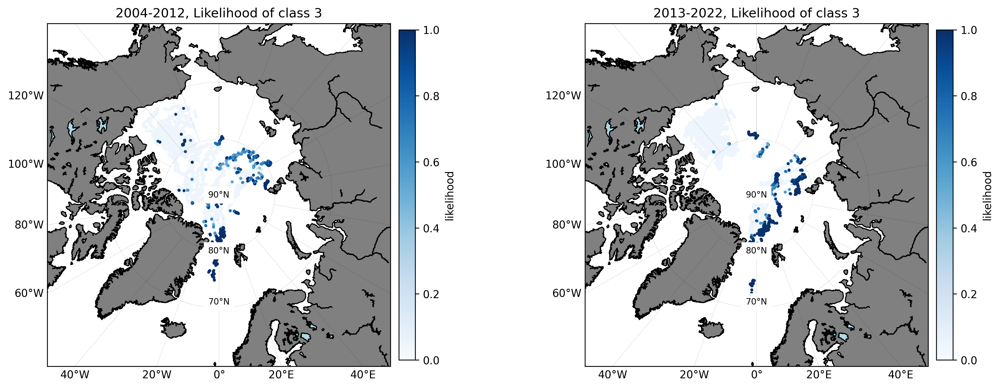

In [6]:
plot_single_class_likelihood_by_decade(ds_fit_relabeled_750_latlonT_5_60_95_k4, class_num=3)

# Seperate the data into two group that each cover a decade, and see how the averaged profile of T and S of a class changed

In [2]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def plot_mean_profile_by_decade(ds_fit,class_num=0):
    # ds_fit['decade'] = pd.cut(ds_fit['date'].dt.year, bins=[2004, 2013, 2022], labels=['2004-2012', '2013-2022'])
    # ds_fit.assign_coords(decade=pd.cut(ds_fit['date'].dt.year, bins=[2004, 2013, 2022], labels=['2004-2012', '2013-2022']))
    decade_list=['2004-2012', '2013-2022']
    decade_start=[2004, 2013]


    # ds_grouped = ds_fit.groupby('decade')
    num_decades = 2 #len(ds_grouped)

    # Create a figure and axes for the subplots
    fig, axes = plt.subplots(1, 2, figsize=(12, 7), dpi=300)
    cmap = plt.cm.get_cmap('tab20', num_decades)
    color_list=cmap.colors
    # color_list = ['red', 'saddlebrown', 'deepskyblue',  'purple']  # Define your own color list

    
    for i in range(len(decade_list)):
        # ds_decade = ds_fit.where(ds_fit['date'].dt.year >=decade_start[i] & ds_fit['date'].dt.year <decade_start[i]+9, drop=True)
        ds_decade = ds_fit.where((ds_fit['date'].dt.year >= decade_start[i]) & (ds_fit['date'].dt.year < decade_start[i] + 9), drop=True)


       
        ds_class = ds_decade.where(ds_decade.PCM_LABELS == class_num, drop=True)

        qua5_temp = np.quantile(ds_class['temperature'], 0.05, axis=0)
        qua95_temp = np.quantile(ds_class['temperature'], 0.95, axis=0)
        qua50_temp = np.quantile(ds_class['temperature'], 0.50, axis=0)

        qua5_salinity = np.quantile(ds_class['salinity'], 0.05, axis=0)
        qua95_salinity = np.quantile(ds_class['salinity'], 0.95, axis=0)
        qua50_salinity = np.quantile(ds_class['salinity'], 0.50, axis=0)

        ax = axes[0]
        ax.plot(qua50_temp, ds_fit['pressure'].values, c=color_list[i], label=f'Year {decade_list[i]}')
        ax.fill_betweenx(ds_fit['pressure'].values, qua5_temp, qua95_temp, color=color_list[i], alpha=0.5)
        ax.legend(loc='lower left')
        ax.set_ylim([np.min(ds_fit['pressure'].values), np.max(ds_fit['pressure'].values)])
        ax.set_ylabel('Pressure')
        ax.set_xlabel('Temperature')

        ax = axes[1]
        ax.plot(qua50_salinity, ds_fit['pressure'].values, c=color_list[i], label=f'Year {decade_list[i]}')
        ax.fill_betweenx(ds_fit['pressure'].values, qua5_salinity, qua95_salinity, color=color_list[i], alpha=0.5)
        ax.set_ylim([np.min(ds_fit['pressure'].values), np.max(ds_fit['pressure'].values)])
        ax.legend(loc='lower left')
        ax.set_ylabel('Pressure')
        ax.set_xlabel('Salinity')

    plt.show()

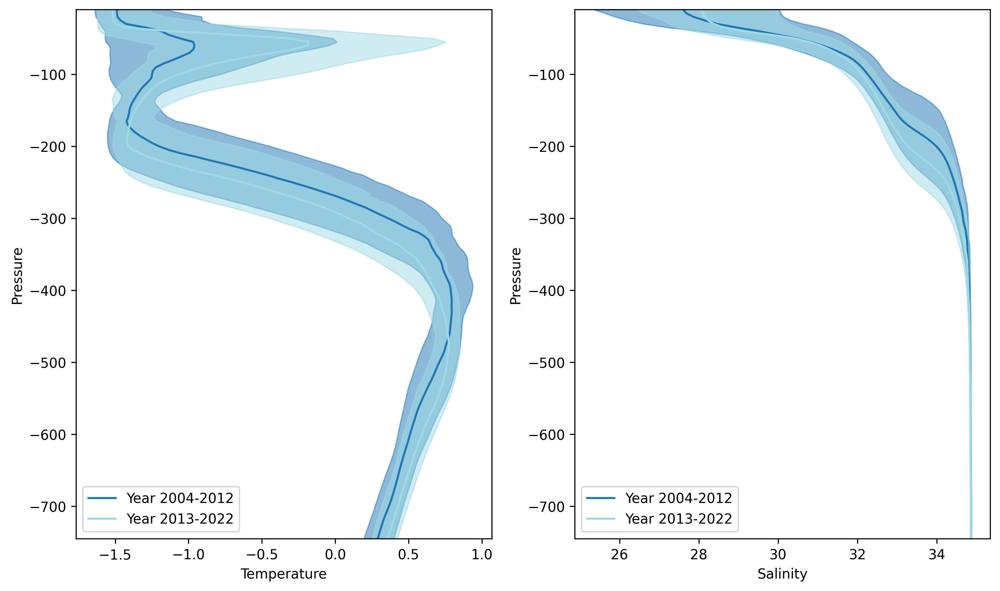

In [4]:
plot_mean_profile_by_decade(ds_fit_relabeled_750_latlonT_5_60_95_k4,class_num=2)

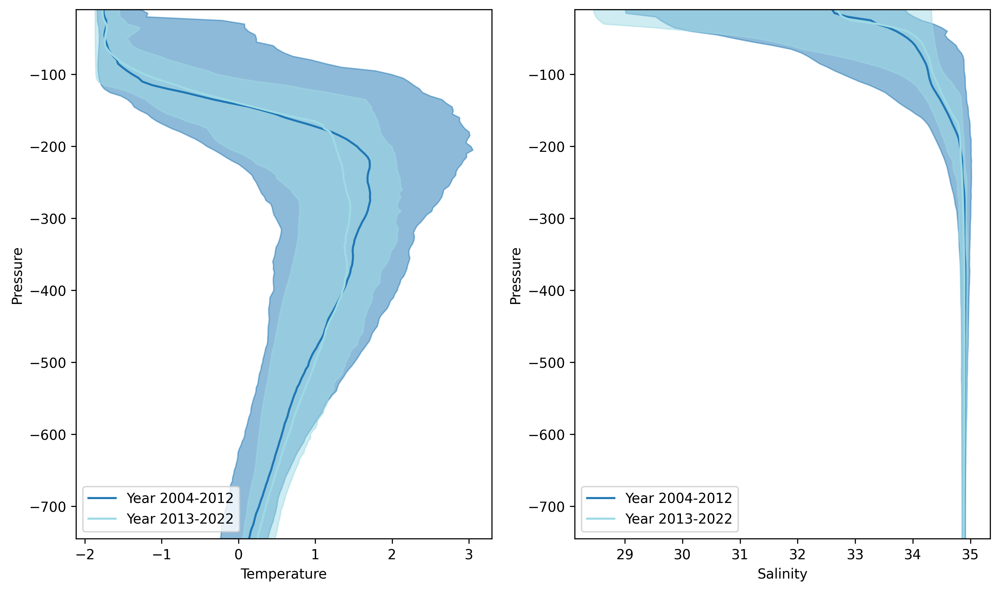

In [3]:
plot_mean_profile_by_decade(ds_fit_relabeled_750_latlonT_5_60_95_k4,class_num=3)

# Remove the month distribution of the data, to see whther the difference between two decades are caused by seasonal variability of the data

In [18]:
import numpy as np
import matplotlib.pyplot as plt

def plot_monthly_dis_by_decades(ds_fit):
    fig, ax = plt.subplots(1, 2, figsize=(12, 6), dpi=300)

    decade_list = ['2004-2012', '2013-2022']
    decade_start = [2004, 2013]
    # ds_fit.assign_coords(decade=pd.cut(ds_fit['date'].dt.year, bins=[2004, 2013, 2022], labels=['2004-2012', '2013-2022']))

    # ds_grouped = ds_fit.groupby('decade')

    for i in range(len(decade_list)):
        ds_cleaned = ds_fit.where((ds_fit['date'].dt.year >= decade_start[i]) & (ds_fit['date'].dt.year < decade_start[i] + 9), drop=True)
        months = ds_cleaned.date.dt.month.values

        bins_month = np.arange(1, 14)
        ax[i].hist(months, bins=bins_month, color='cornflowerblue', edgecolor='black', linewidth=1)
        ax[i].set_xlabel('Month')
        ax[i].set_ylabel('Number of profiles')
        ax[i].set_xticks([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 1])
        ax[i].set_title(f'{decade_list[i]}')

    plt.show()


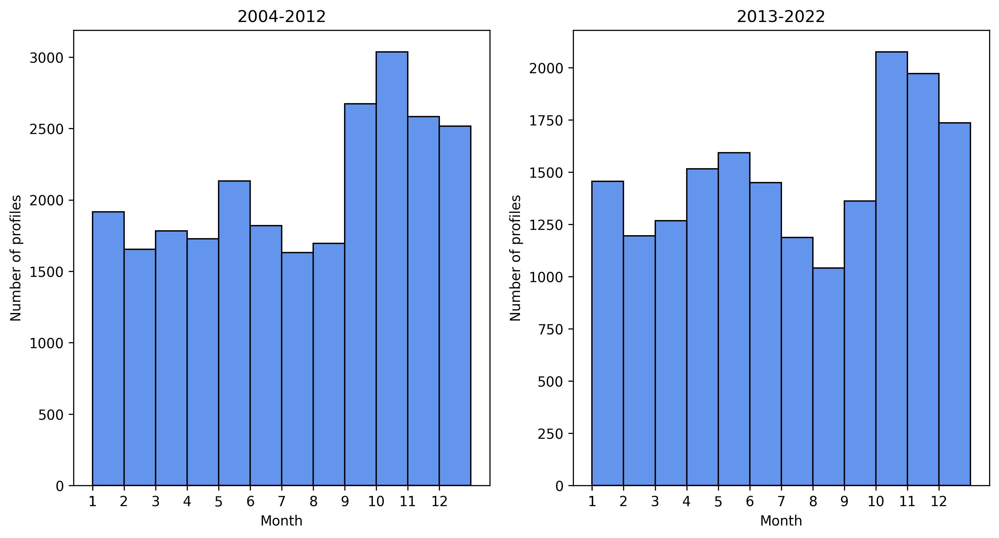

In [19]:
plot_monthly_dis_by_decades(ds_fit_750_latlonT_5_60_95_k4)

In [20]:
import xarray as xr
import numpy as np

def sample_data_monthly_for_decades(ds_fit, selected_size_monthly=900, random_seed=0):
    # ds_fit.assign_coords(decade=pd.cut(ds_fit['date'].dt.year, bins=[2004, 2013, 2022], labels=['2004-2012', '2013-2022']))
    # ds_grouped = ds_fit.groupby('decade')
    
    decade_list = ['2004-2012', '2013-2022']
    decade_start = [2004, 2013]

    # ds_fit['decade'] = (ds_fit['date'].dt.year // 10) * 10

    selected_datasets = []

    for i in range(len(decade_list)):
        ds = ds_fit.where((ds_fit['date'].dt.year >= decade_start[i]) & (ds_fit['date'].dt.year < decade_start[i] + 9), drop=True)

        ds_monthly = ds.groupby('date.month')
        months_with_data = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]

        selected_datasets.extend([ds_monthly[month].isel(nprof=np.random.default_rng(random_seed).choice(ds_monthly[month].nprof.size, int(selected_size_monthly), replace=False)) for month in months_with_data])

    ds_selected = xr.concat(selected_datasets, dim='nprof')
    
    return ds_selected




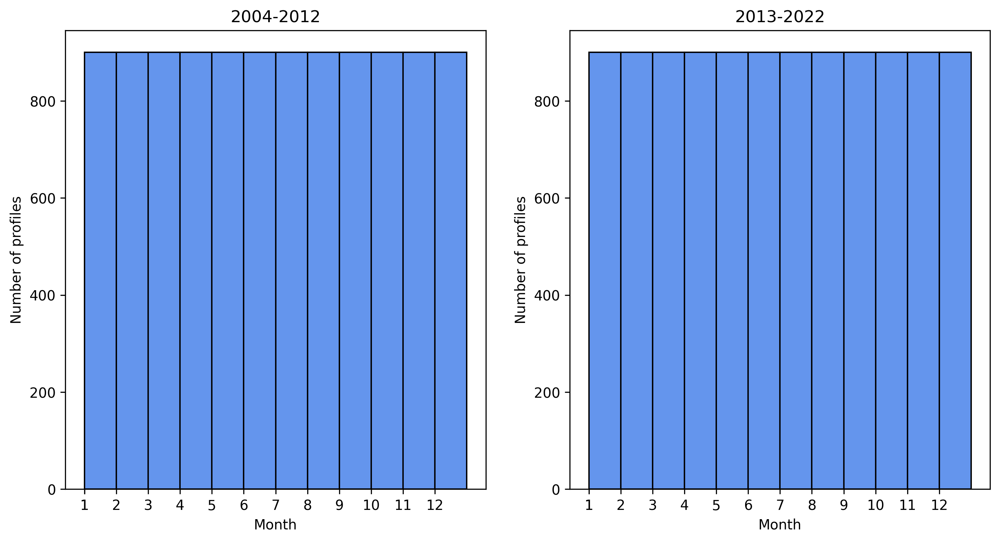

In [21]:
ds_selected = sample_data_monthly_for_decades(ds_fit_750_latlonT_5_60_95_k4, selected_size_monthly=900, random_seed=0)
plot_monthly_dis_by_decades(ds_selected)

# No, the difference between two decades continued

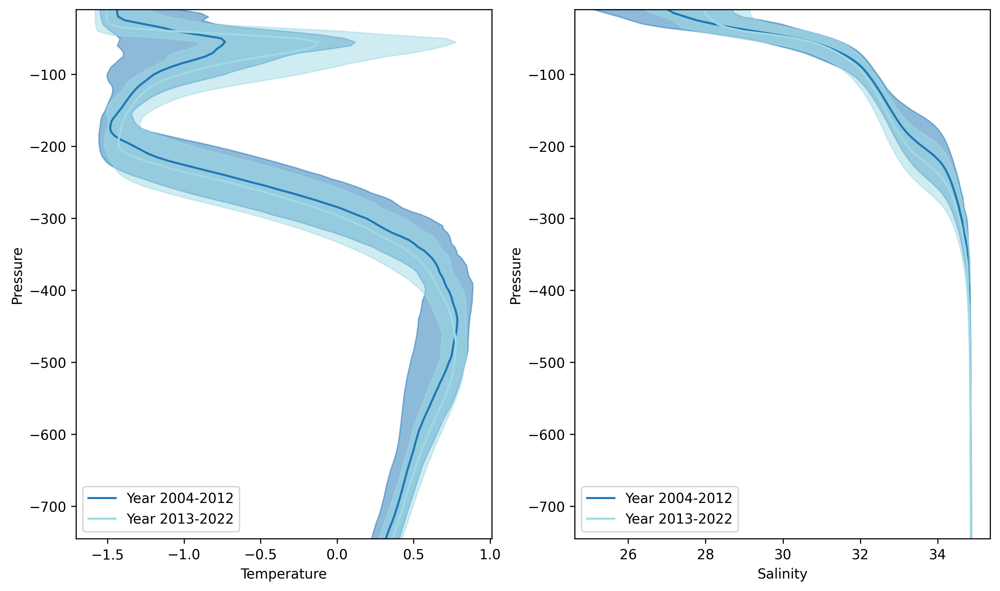

In [43]:
plot_mean_profile_by_decade(ds_selected,class_num=3)

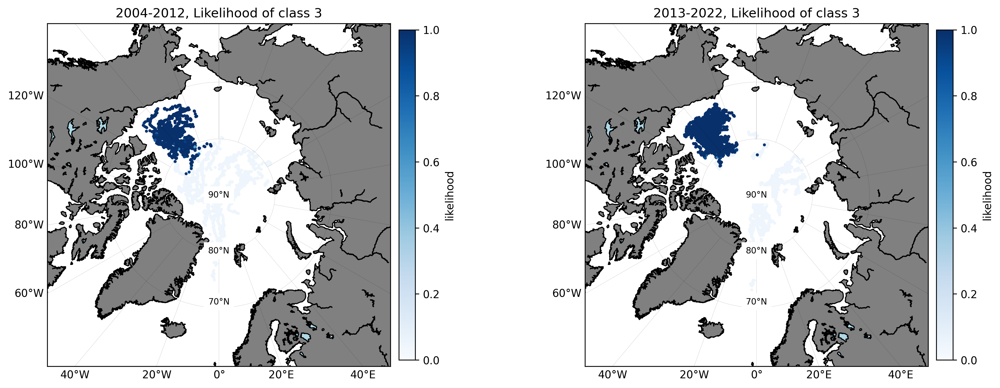

In [24]:
plot_single_class_likelihood_by_decade(ds_selected, class_num=3)

# Plot the T-S profile for each decade 

In [59]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def plot_TandS_by_decade(ds_fit,class_num=0):

    decade_list=['2004-2012', '2013-2022']
    decade_start=[2004, 2013]

    num_decades = 2 #len(ds_grouped)

    # Create a figure and axes for the subplots
    fig, ax = plt.subplots(1, 1, figsize=(6, 7), dpi=300)

    # color_list = ['red', 'saddlebrown', 'deepskyblue',  'purple']  # Define your own color list
    cmap = plt.cm.get_cmap('tab20', num_decades)
    color_list=cmap.colors

    symbols = ['o', 's', '^', 'd']
    
    for i in range(len(decade_list)):
        # ds_decade = ds_fit.where(ds_fit['date'].dt.year >=decade_start[i] & ds_fit['date'].dt.year <decade_start[i]+9, drop=True)
        ds_decade = ds_fit.where((ds_fit['date'].dt.year >= decade_start[i]) & (ds_fit['date'].dt.year < decade_start[i] + 9), drop=True)


       
        ds_class = ds_decade.where(ds_decade.PCM_LABELS == class_num, drop=True)

        if i == 0:
            ax.plot(ds_class['salinity'].values.T, ds_class['temperature'].values.T, c=color_list[i], alpha=1)
            ax.plot(
                ds_class['salinity'].values[0],
                ds_class['temperature'].values[0],
                c=color_list[i],
                label=f'class {class_num}, {decade_list[i]}',
                alpha=1
            )

        else:
            ax.plot(ds_class['salinity'].values.T, ds_class['temperature'].values.T, c=color_list[i], alpha=0.3)
            ax.plot(
                ds_class['salinity'].values[0],
                ds_class['temperature'].values[0],
                c=color_list[i],
                label=f'class {class_num}, {decade_list[i]}',
                alpha=0.3
            )
        
    # for i in range(len(decade_list)):
    #     ax.plot(
    #         ds_class['salinity'].mean(dim='nprof'),
    #         ds_class['temperature'].mean(dim='nprof'),
    #         c='k',
    #         marker=symbols[i],
    #         markersize=3,
    #         label=f'mean of class {class_num}, {decade_list[i]}',
    #         alpha=1
    #     )

            
    for i in range(len(decade_list)):
        # ds_decade = ds_fit.where(ds_fit['date'].dt.year >=decade_start[i] & ds_fit['date'].dt.year <decade_start[i]+9, drop=True)
        ds_decade = ds_fit.where((ds_fit['date'].dt.year >= decade_start[i]) & (ds_fit['date'].dt.year < decade_start[i] + 9), drop=True)
        ds_class = ds_decade.where(ds_decade.PCM_LABELS == class_num, drop=True)

        ax.plot(
            np.median(ds_class['salinity'].values.T, axis=1),
            np.median(ds_class['temperature'].values.T, axis=1),
            c='k',
            marker=symbols[i],
            markersize=3,
            label=f'mean of class {class_num}, {decade_list[i]}',
            alpha=1
        )

        

        ax.legend()
        ax.set_xlabel('Salinity')
        ax.set_ylabel('Temperature (°C)')

    plt.show()

    

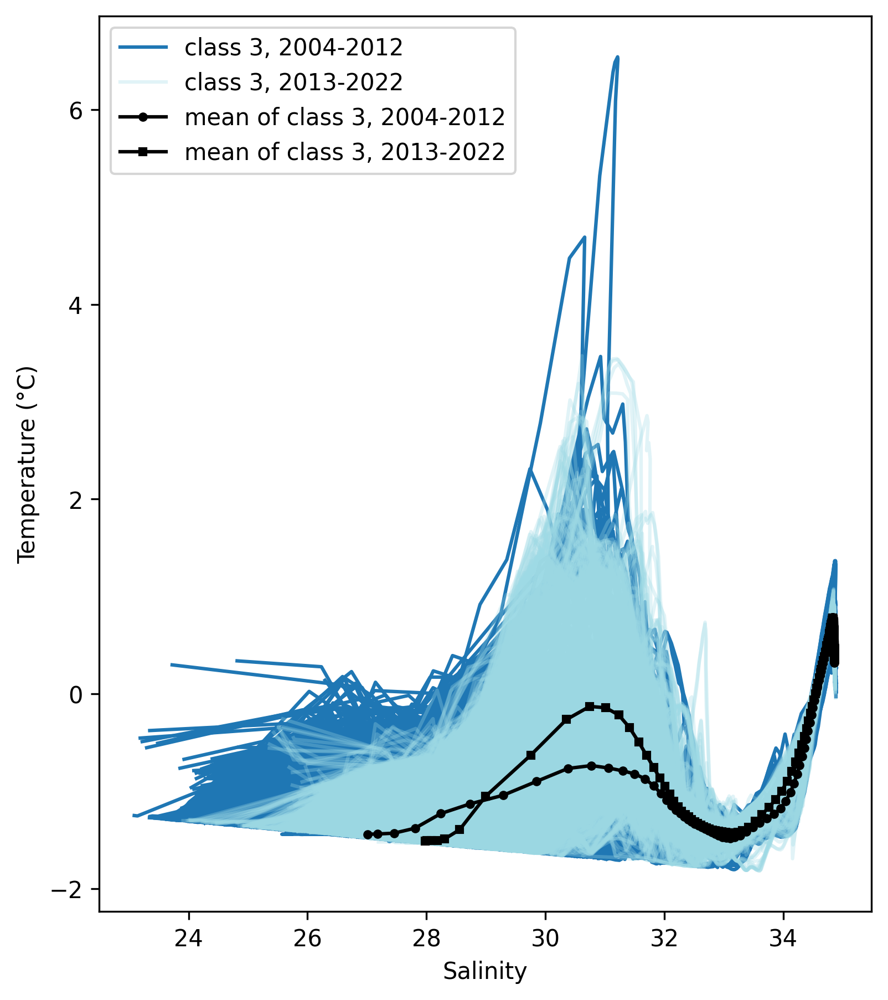

In [60]:
plot_TandS_by_decade(ds_fit_750_latlonT_5_60_95_k4,class_num=3)

# Plot the average T and S profile for a class for each year

In [5]:
# import the relabeled data from local file
import xarray as xr
Relabeled_data_path = 'D:/VScode/MRes/Clustering_under_the_ice/Relabeled_data/'
ds_fit_relabeled_750_latlonT_5_60_95_k4=xr.open_dataset(Relabeled_data_path + 'ds_fit_relabeled_750_latlonT_5_60_95_k4.nc')
ds_fit_relabeled_750_latlonT_5_50_95_k4=xr.open_dataset(Relabeled_data_path + 'ds_fit_relabeled_750_latlonT_5_50_95_k4.nc')
ds_fit_relabeled_750_latlonT_5_70_95_k4=xr.open_dataset(Relabeled_data_path + 'ds_fit_relabeled_750_latlonT_5_70_95_k4.nc')

In [4]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def plot_mean_profile_by_year(ds_fit,class_num=0):

    # get the year of the ds_fit
    years=np.unique(ds_fit['date'].dt.year.values)
    num_years=len(years)


    # Create a figure and axes for the subplots
    fig, axes = plt.subplots(2, 3, figsize=(14, 10), dpi=300)
    cmap = plt.cm.get_cmap('tab20', num_years)
    color_list=cmap.colors
    # color_list = ['red', 'saddlebrown', 'deepskyblue',  'purple']  # Define your own color list

    year_max_temp=[]
    year_min_salinity=[]
    year_min_oxy=[]
    
    for i in range(num_years):

        ds_year = ds_fit.where(ds_fit['date'].dt.year==years[i], drop=True)
        ds_class = ds_year.where(ds_year.PCM_LABELS == class_num, drop=True)

        qua50_temp = np.quantile(ds_class['temperature'].values, 0.50, axis=0)
        qua50_salinity = np.quantile(ds_class['salinity'].values, 0.50, axis=0)

        # get the first 28 values of the qua50_temp
        qua50_temp_chuncked=qua50_temp[0:28]
        # get the max value of the qua50_temp_chuncked and its index
        max_temp=np.max(qua50_temp_chuncked)
        max_temp_index=np.where(qua50_temp_chuncked==max_temp)[0][0]
        # print(f'max_temp_index= {max_temp_index}')
        # get the pressure value of the max_temp_index
        max_temp_pressure=ds_fit['pressure'].values[max_temp_index]

        # store the year and the max_temp in a list
        year_max_temp.append([years[i],max_temp])

        # get the min salinity value of the qua50_salinity
        min_salinity=qua50_salinity[4]
        # min_salinity_index=np.where(qua50_salinity==min_salinity)[0][0]
        # get the pressure value of the min_salinity_index
        # min_salinity_pressure=ds_fit['pressure'].values[min_salinity_index]
        min_salinity_pressure=ds_fit['pressure'].values[4]
        # store the year and the min_salinity in a list
        year_min_salinity.append([years[i],min_salinity])



        axes[0,0].plot(qua50_temp, ds_fit['pressure'].values, c=color_list[i], label=f'{years[i]}')
        # plot a red dot at the max_temp_pressure
        axes[0,0].plot(max_temp, max_temp_pressure, 'ko', markersize=3)


        axes[0,1].plot(qua50_salinity, ds_fit['pressure'].values, c=color_list[i], label=f'{years[i]}')
        # plot a red dot at the min_salinity_pressure
        axes[0,1].plot(min_salinity, min_salinity_pressure, 'ko', markersize=3)
        
        oxy_data=ds_class['dissolved_oxygen'].values
        # print(f'oxy_data= {oxy_data.shape}')
        nan_rows = np.isnan(oxy_data).any(axis=1)
        # print(f'nan_rows= {nan_rows.shape}')

        #compare the nan_rows with the row numbers of oxy_data
        if np.all(nan_rows):
            print(f'all rows of diss_oxy are nan, skip year {years[i]}')
        else:
            # Delete rows with NaN values
            oxy_data_without_nan = oxy_data[~nan_rows]
            # print(f'oxy_data_without_nan= {oxy_data_without_nan.shape}')

            qua50_oxy = np.quantile(oxy_data_without_nan, 0.50, axis=0)

            # get the first 28 values of the qua50_oxy
            # qua50_oxy_chuncked=qua50_oxy[0:28]
            qua50_oxy_chuncked=qua50_oxy
            # qua50_oxy_chuncked=qua50_oxy[0:4]
            # get the min value of the qua50_oxy_chuncked and its index
            # min_oxy=np.min(qua50_oxy_chuncked)
            min_oxy=qua50_oxy_chuncked[4]
            # min_oxy_index=np.where(qua50_oxy_chuncked==min_oxy)[0][0]
            # min_oxy_pressure=ds_fit['pressure'].values[min_oxy_index]
            min_oxy_pressure=ds_fit['pressure'].values[4]
            # store the year and the min_oxy in a list
            year_min_oxy.append([years[i],min_oxy])

            axes[0,2].plot(qua50_oxy, ds_fit['pressure'].values, c=color_list[i], label=f'{years[i]}')
            # plot a red dot at the min_oxy_pressure
            axes[0,2].plot(min_oxy, min_oxy_pressure, 'ko', markersize=3)

    
    axes[0,0].set_xlabel('Temperature (°C)')
    axes[0,0].set_ylabel('Pressure (dbar)')
    axes[0,0].set_ylim([np.min(ds_fit['pressure'].values), np.max(ds_fit['pressure'].values)])
    # set the ytiklabel to be its absolute value
    axes[0,0].set_yticklabels(np.abs(axes[0,0].get_yticks()).astype(int))
    

    axes[0,1].set_xlabel('Salinity (g/kg)')
    axes[0,1].legend(loc='lower left',ncol=2)
    axes[0,1].set_ylim([np.min(ds_fit['pressure'].values), np.max(ds_fit['pressure'].values)])
    # set the ytiklabel to be its absolute value
    axes[0,1].set_yticklabels(np.abs(axes[0,1].get_yticks()).astype(int))

    axes[0,2].set_xlabel('Dissolved oxygen (µmol/kg)')
    axes[0,2].set_ylim([np.min(ds_fit['pressure'].values), np.max(ds_fit['pressure'].values)])
    # set the ytiklabel to be its absolute value
    axes[0,2].set_yticklabels(np.abs(axes[0,2].get_yticks()).astype(int))

    # plot the max_temp vs year using line plot with each data point marked by a red dot
    axes[1,0].plot(np.array(year_max_temp)[:,0],np.array(year_max_temp)[:,1],'ro-',markersize=3,label=' Temperature')
    # fit a linear regression line
    z = np.polyfit(np.array(year_max_temp)[:,0], np.array(year_max_temp)[:,1], 1)
    p = np.poly1d(z)
    # annotate the linear regression line and its slope
    axes[1,0].plot(np.array(year_max_temp)[:,0],p(np.array(year_max_temp)[:,0]),"r--",label=f'slope={z[0]:.2f}')
    
    axes[1,0].set_xlabel('Year')
    axes[1,0].set_ylabel('Maximum temperature in the PSW (°C)')
    axes[1,0].set_ylim([np.min(np.array(year_max_temp)[:,1]), np.max(np.array(year_max_temp)[:,1])])
    axes[1,0].legend(loc='upper left')

    # plot the min_salinity vs year using line plot with each data point marked by a red dot
    axes[1,1].plot(np.array(year_min_salinity)[:,0],np.array(year_min_salinity)[:,1],'go-',markersize=3,label='Salinity')
    # fit a linear regression line
    z = np.polyfit(np.array(year_min_salinity)[:,0], np.array(year_min_salinity)[:,1], 1)
    p = np.poly1d(z)
    # annotate the linear regression line and its slope
    axes[1,1].plot(np.array(year_min_salinity)[:,0],p(np.array(year_min_salinity)[:,0]),"g--",label=f'slope={z[0]:.2f}')
    axes[1,1].legend(loc='upper left')
    axes[1,1].set_xlabel('Year')
    axes[1,1].set_ylabel('Salinity at P=30 dbar (g/kg)')
    axes[1,1].set_ylim([np.min(np.array(year_min_salinity)[:,1]), np.max(np.array(year_min_salinity)[:,1])])

    # plot the min_oxy vs year using line plot with each data point marked by a red dot
    axes[1,2].plot(np.array(year_min_oxy)[:,0],np.array(year_min_oxy)[:,1],'bo-',markersize=3,label=' Dissolved oxygen')
    # fit a linear regression line
    z = np.polyfit(np.array(year_min_oxy)[:,0], np.array(year_min_oxy)[:,1], 1)
    p = np.poly1d(z)
    # annotate the linear regression line and its slope
    axes[1,2].plot(np.array(year_min_oxy)[:,0],p(np.array(year_min_oxy)[:,0]),"b--",label=f'slope={z[0]:.2f}')
    axes[1,2].legend(loc='upper right')
    axes[1,2].set_xlabel('Year')
    axes[1,2].set_ylabel('Dissolved oxygen at P=30 dbar (µmol/kg)')   
    axes[1,2].set_ylim([np.min(np.array(year_min_oxy)[:,1]), np.max(np.array(year_min_oxy)[:,1])])
    # set the xticklabel to be integer (the year_min_oxy[:,0])
    axes[1,2].set_xticklabels(np.array(year_min_oxy)[:,0].astype(int))



    plt.subplots_adjust(wspace=0.4, hspace=0.3)
    plt.show()

all rows of diss_oxy are nan, skip year 2004
all rows of diss_oxy are nan, skip year 2005
all rows of diss_oxy are nan, skip year 2020
all rows of diss_oxy are nan, skip year 2021
all rows of diss_oxy are nan, skip year 2022


C:\Users\zps19\AppData\Local\Temp\ipykernel_896\916726012.py:99: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[0,0].set_yticklabels(np.abs(axes[0,0].get_yticks()).astype(int))
C:\Users\zps19\AppData\Local\Temp\ipykernel_896\916726012.py:106: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[0,1].set_yticklabels(np.abs(axes[0,1].get_yticks()).astype(int))
C:\Users\zps19\AppData\Local\Temp\ipykernel_896\916726012.py:111: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[0,2].set_yticklabels(np.abs(axes[0,2].get_yticks()).astype(int))
C:\Users\zps19\AppData\Local\Temp\ipykernel_896\916726012.py:150: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[1,2].set_xticklabels(np.array(year_min_oxy)[:,0].astype(int))


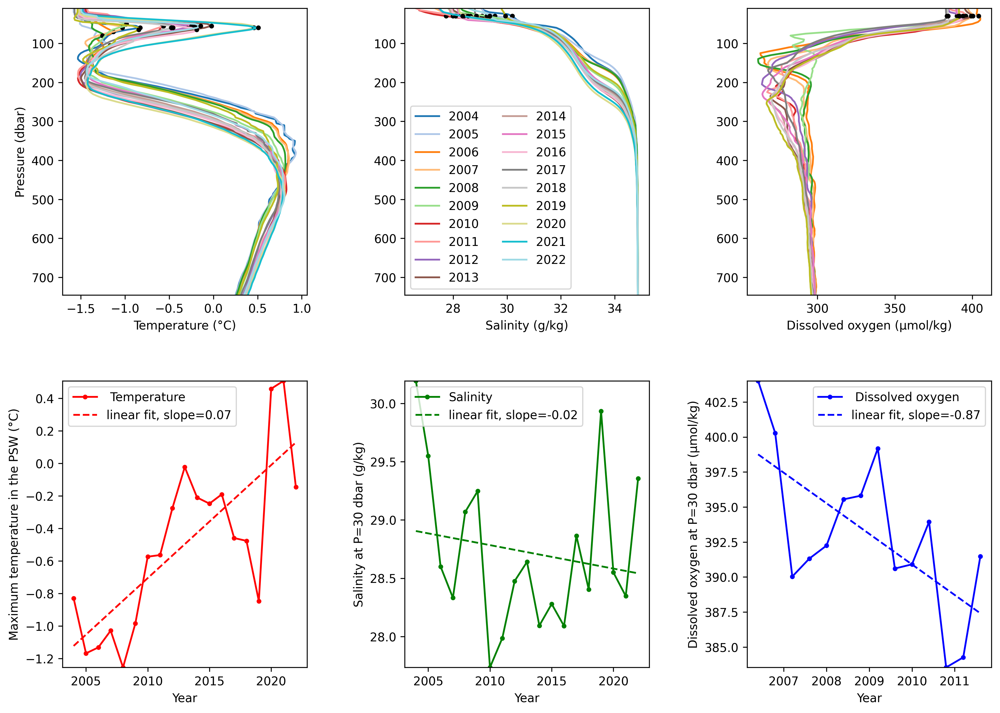

In [19]:
plot_mean_profile_by_year(ds_fit_relabeled_750_latlonT_5_60_95_k4, 2)


In [14]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from scipy.stats import linregress

def plot_mean_profile_by_year(ds_fit,class_num=0):

    # get the year of the ds_fit
    years=np.unique(ds_fit['date'].dt.year.values)
    num_years=len(years)


    # Create a figure and axes for the subplots
    fig, axes = plt.subplots(2, 3, figsize=(14, 10), dpi=300)
    cmap = plt.cm.get_cmap('tab20', num_years)
    color_list=cmap.colors
    # color_list = ['red', 'saddlebrown', 'deepskyblue',  'purple']  # Define your own color list

    year_max_temp=[]
    year_min_salinity=[]
    year_min_oxy=[]
    
    for i in range(num_years):

        ds_year = ds_fit.where(ds_fit['date'].dt.year==years[i], drop=True)
        ds_class = ds_year.where(ds_year.PCM_LABELS == class_num, drop=True)

        qua50_temp = np.quantile(ds_class['temperature'].values, 0.50, axis=0)
        qua50_salinity = np.quantile(ds_class['salinity'].values, 0.50, axis=0)

        # get the first 28 values of the qua50_temp
        qua50_temp_chuncked=qua50_temp[0:28]
        # get the max value of the qua50_temp_chuncked and its index
        max_temp=np.max(qua50_temp_chuncked)
        max_temp_index=np.where(qua50_temp_chuncked==max_temp)[0][0]
        # print(f'max_temp_index= {max_temp_index}')
        # get the pressure value of the max_temp_index
        max_temp_pressure=ds_fit['pressure'].values[max_temp_index]

        # store the year and the max_temp in a list
        year_max_temp.append([years[i],max_temp])

        # get the min salinity value of the qua50_salinity
        min_salinity=qua50_salinity[4]
        # min_salinity_index=np.where(qua50_salinity==min_salinity)[0][0]
        # get the pressure value of the min_salinity_index
        # min_salinity_pressure=ds_fit['pressure'].values[min_salinity_index]
        min_salinity_pressure=ds_fit['pressure'].values[4]
        # store the year and the min_salinity in a list
        year_min_salinity.append([years[i],min_salinity])



        axes[0,0].plot(qua50_temp, ds_fit['pressure'].values, c=color_list[i], label=f'{years[i]}')
        # plot a red dot at the max_temp_pressure
        axes[0,0].plot(max_temp, max_temp_pressure, 'ko', markersize=3)


        axes[0,1].plot(qua50_salinity, ds_fit['pressure'].values, c=color_list[i], label=f'{years[i]}')
        # plot a red dot at the min_salinity_pressure
        axes[0,1].plot(min_salinity, min_salinity_pressure, 'ko', markersize=3)
        
        oxy_data=ds_class['dissolved_oxygen'].values
        # print(f'oxy_data= {oxy_data.shape}')
        nan_rows = np.isnan(oxy_data).any(axis=1)
        # print(f'nan_rows= {nan_rows.shape}')

        #compare the nan_rows with the row numbers of oxy_data
        if np.all(nan_rows):
            print(f'all rows of diss_oxy are nan, skip year {years[i]}')
        else:
            # Delete rows with NaN values
            oxy_data_without_nan = oxy_data[~nan_rows]
            # print(f'oxy_data_without_nan= {oxy_data_without_nan.shape}')

            qua50_oxy = np.quantile(oxy_data_without_nan, 0.50, axis=0)

            # get the first 28 values of the qua50_oxy
            # qua50_oxy_chuncked=qua50_oxy[0:28]
            qua50_oxy_chuncked=qua50_oxy
            # qua50_oxy_chuncked=qua50_oxy[0:4]
            # get the min value of the qua50_oxy_chuncked and its index
            # min_oxy=np.min(qua50_oxy_chuncked)
            min_oxy=qua50_oxy_chuncked[4]
            # min_oxy_index=np.where(qua50_oxy_chuncked==min_oxy)[0][0]
            # min_oxy_pressure=ds_fit['pressure'].values[min_oxy_index]
            min_oxy_pressure=ds_fit['pressure'].values[4]
            # store the year and the min_oxy in a list
            year_min_oxy.append([years[i],min_oxy])

            axes[0,2].plot(qua50_oxy, ds_fit['pressure'].values, c=color_list[i], label=f'{years[i]}')
            # plot a red dot at the min_oxy_pressure
            axes[0,2].plot(min_oxy, min_oxy_pressure, 'ko', markersize=3)

    
    axes[0,0].set_xlabel('Temperature (°C)')
    axes[0,0].set_ylabel('Pressure (dbar)')
    axes[0,0].set_ylim([np.min(ds_fit['pressure'].values), np.max(ds_fit['pressure'].values)])
    # set the ytiklabel to be its absolute value
    axes[0,0].set_yticklabels(np.abs(axes[0,0].get_yticks()).astype(int))
    

    axes[0,1].set_xlabel('Salinity (g/kg)')
    axes[0,1].legend(loc='lower left',ncol=2)
    axes[0,1].set_ylim([np.min(ds_fit['pressure'].values), np.max(ds_fit['pressure'].values)])
    # set the ytiklabel to be its absolute value
    axes[0,1].set_yticklabels(np.abs(axes[0,1].get_yticks()).astype(int))

    axes[0,2].set_xlabel('Dissolved oxygen (µmol/kg)')
    axes[0,2].set_ylim([np.min(ds_fit['pressure'].values), np.max(ds_fit['pressure'].values)])
    # set the ytiklabel to be its absolute value
    axes[0,2].set_yticklabels(np.abs(axes[0,2].get_yticks()).astype(int))

    # plot the max_temp vs year using line plot with each data point marked by a red dot
    axes[1,0].plot(np.array(year_max_temp)[:,0],np.array(year_max_temp)[:,1],'ro-',markersize=3,label=' Temperature')
    # fit a linear regression line
    z = np.polyfit(np.array(year_max_temp)[:,0], np.array(year_max_temp)[:,1], 1)
    p = np.poly1d(z)
    slope, intercept, r_value, p_value, std_err = linregress(np.array(year_max_temp)[:,0], np.array(year_max_temp)[:,1])
    # annotate the linear regression line, its slope, R-square, and p-value
    axes[1,0].plot(np.array(year_max_temp)[:,0],p(np.array(year_max_temp)[:,0]),"r--",label=f'slope={slope:.2f}, $R^2$={r_value**2:.2f}, p={p_value:.4f}')
    
    axes[1,0].set_xlabel('Year')
    axes[1,0].set_ylabel('Maximum temperature in the PSW (°C)')
    axes[1,0].set_ylim([np.min(np.array(year_max_temp)[:,1]), np.max(np.array(year_max_temp)[:,1])])
    axes[1,0].legend(loc='upper left')

    # plot the min_salinity vs year using line plot with each data point marked by a red dot
    axes[1,1].plot(np.array(year_min_salinity)[:,0],np.array(year_min_salinity)[:,1],'go-',markersize=3,label='Salinity')
    # fit a linear regression line
    z = np.polyfit(np.array(year_min_salinity)[:,0], np.array(year_min_salinity)[:,1], 1)
    p = np.poly1d(z)
    # compute R-square and p-value
    slope, intercept, r_value, p_value, std_err = linregress(np.array(year_min_salinity)[:,0], np.array(year_min_salinity)[:,1])
    # annotate the linear regression line, its slope, R-square, and p-value
    axes[1,1].plot(np.array(year_min_salinity)[:,0],p(np.array(year_min_salinity)[:,0]),"g--",label=f'slope={slope:.2f}, $R^2$={r_value**2:.2f}, p={p_value:.3f}')
    axes[1,1].legend(loc='upper left')
    axes[1,1].legend(loc='upper left')
    axes[1,1].set_xlabel('Year')
    axes[1,1].set_ylabel('Salinity at P=30 dbar (g/kg)')
    axes[1,1].set_ylim([np.min(np.array(year_min_salinity)[:,1]), np.max(np.array(year_min_salinity)[:,1])])

    # plot the min_oxy vs year using line plot with each data point marked by a red dot
    axes[1,2].plot(np.array(year_min_oxy)[:,0],np.array(year_min_oxy)[:,1],'bo-',markersize=3,label=' Dissolved oxygen')
    # fit a linear regression line
    z = np.polyfit(np.array(year_min_oxy)[:,0], np.array(year_min_oxy)[:,1], 1)
    p = np.poly1d(z)
    # compute R-square and p-value
    slope, intercept, r_value, p_value, std_err = linregress(np.array(year_min_oxy)[:,0], np.array(year_min_oxy)[:,1])
    # annotate the linear regression line, its slope, R-square, and p-value
    axes[1,2].plot(np.array(year_min_oxy)[:,0],p(np.array(year_min_oxy)[:,0]),"b--",label=f'slope={slope:.2f}, $R^2$={r_value**2:.2f}, p={p_value:.3f}')
    axes[1,2].legend(loc='upper right')
    axes[1,2].set_xlabel('Year')
    axes[1,2].set_ylabel('Dissolved oxygen at P=30 dbar (µmol/kg)')   
    axes[1,2].set_ylim([np.min(np.array(year_min_oxy)[:,1]), np.max(np.array(year_min_oxy)[:,1])])
    # set the xticklabel to be integer (the year_min_oxy[:,0])
    axes[1,2].set_xticklabels(np.array(year_min_oxy)[:,0].astype(int))



    plt.subplots_adjust(wspace=0.4, hspace=0.3)
    plt.show()

all rows of diss_oxy are nan, skip year 2004
all rows of diss_oxy are nan, skip year 2005
all rows of diss_oxy are nan, skip year 2020
all rows of diss_oxy are nan, skip year 2021
all rows of diss_oxy are nan, skip year 2022


C:\Users\zps19\AppData\Local\Temp\ipykernel_27736\763847069.py:100: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[0,0].set_yticklabels(np.abs(axes[0,0].get_yticks()).astype(int))
C:\Users\zps19\AppData\Local\Temp\ipykernel_27736\763847069.py:107: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[0,1].set_yticklabels(np.abs(axes[0,1].get_yticks()).astype(int))
C:\Users\zps19\AppData\Local\Temp\ipykernel_27736\763847069.py:112: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[0,2].set_yticklabels(np.abs(axes[0,2].get_yticks()).astype(int))
C:\Users\zps19\AppData\Local\Temp\ipykernel_27736\763847069.py:157: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[1,2].set_xticklabels(np.array(year_min_oxy)[:,0].astype(int))


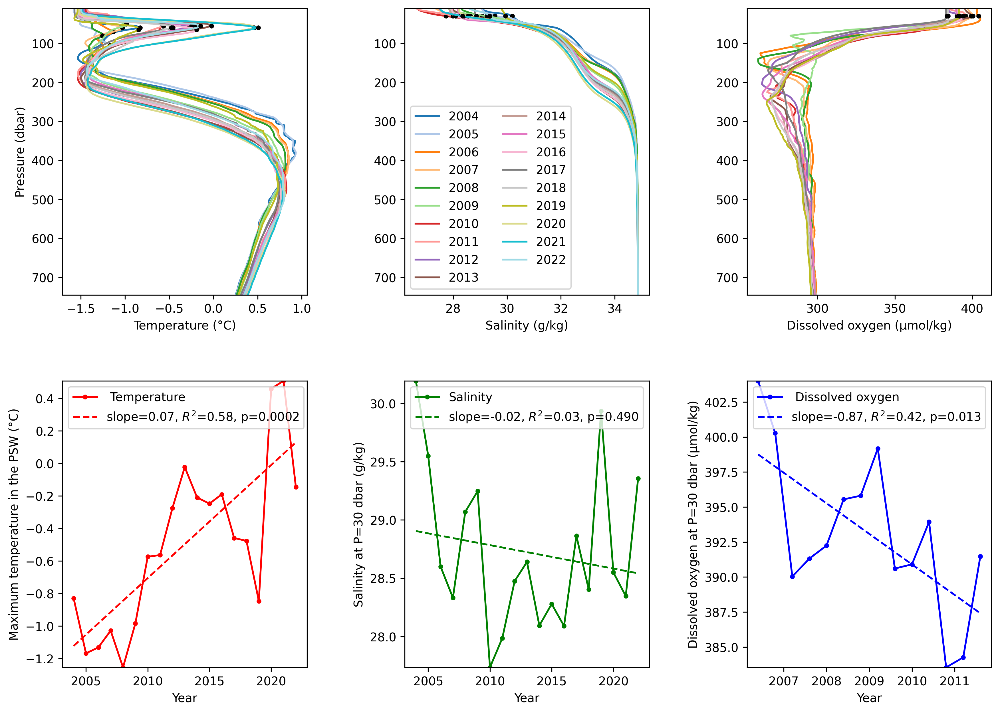

In [15]:
plot_mean_profile_by_year(ds_fit_relabeled_750_latlonT_5_60_95_k4, 2)